In [ ]:
# Cell - 0: Importing Libraries
# PyTorch and related libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader, Subset
import torch.nn.functional as F

# Torchvision for models, transformations, and datasets
import torchvision
from torchvision import models, transforms, datasets
from torchvision.transforms.functional import to_pil_image

# Utility Libraries
import os
import cv2
import numpy as np
from shutil import copy2, move
from collections import Counter
from PIL import Image

# Data Science and Metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# Cell - 1: Unzip the Data if it's not already present
data_dir = '/content/Data'
zip_file = '/content/Data.zip'

if not os.path.exists(data_dir):
    if os.path.exists(zip_file):
        !unzip -q {zip_file} -d /content/
        print("Data unzipped successfully.")
    else:
        print("Data.zip not found. Please upload the data file.")
else:
    print("Data already exists.")

Data unzipped successfully.


In [ ]:
# Cell - 2: Data Splitting and Preparation
# Define directories for training, validation, and testing splits
training_directory = os.path.join(data_dir, 'train')
validation_directory = os.path.join(data_dir, 'val')
testing_directory = os.path.join(data_dir, 'test')

# Define the class names for the dataset (prostate cancer grading categories)
class_labels = ['Benign', 'Gleason3', 'Gleason4', 'Gleason5']

# Create subdirectories for each class within train, val, and test directories
for split_directory in [training_directory, validation_directory, testing_directory]:
    for class_name in class_labels:
        os.makedirs(os.path.join(split_directory, class_name), exist_ok=True)

# Define data split ratios for train, validation, and test datasets
train_ratio, validation_ratio, test_ratio = 0.7, 0.15, 0.15

# Split and move data for each class to respective train, validation, and test folders
for class_name in class_labels:
    # Path to the directory containing images for the current class
    class_directory = os.path.join(data_dir, class_name)

    # Get all image filenames in the current class directory
    image_filenames = os.listdir(class_directory)
    full_image_paths = [os.path.join(class_directory, img) for img in image_filenames]

    # Split the data into training, validation, and test sets
    training_images, temp_images = train_test_split(full_image_paths, train_size=train_ratio, random_state=42)
    validation_images, testing_images = train_test_split(temp_images, test_size=0.5, random_state=42)

    # Move images to their respective directories
    for img_path in training_images:
        move(img_path, os.path.join(training_directory, class_name))
    for img_path in validation_images:
        move(img_path, os.path.join(validation_directory, class_name))
    for img_path in testing_images:
        move(img_path, os.path.join(testing_directory, class_name))

print("Data successfully split into training, validation, and test sets.")

Data successfully split into training, validation, and test sets.


Augmented images have been generated and saved to the relevant class directories.
Updated number of training samples: 840


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


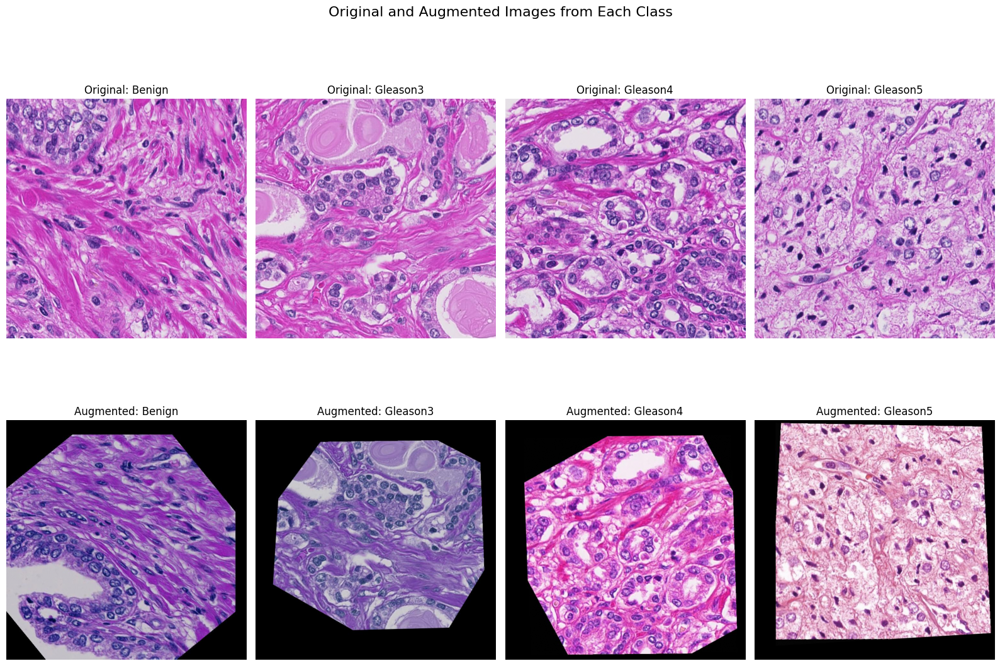

In [ ]:
# Cell - 3: Data Transformations, Augmentation, and Saving Augmented Data

import random
from torchvision.transforms import functional as F

# Define data transformations for training, validation, and testing datasets
training_transformations = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match the input size expected by the model
    transforms.ToTensor(),  # Convert image to tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize using ImageNet means and stds
])

# Define additional data augmentation transformations for saving new training data
augmentation_transformations = transforms.Compose([
    transforms.RandomRotation(degrees=(-45, 45)),  # Random rotation between -45 and 45 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Random changes in brightness, contrast, etc.
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),  # Random translation
    transforms.RandomHorizontalFlip(p=0.5),  # Random horizontal flip
    transforms.RandomVerticalFlip(p=0.5),  # Random vertical flip for more diverse augmentations
    transforms.RandomPerspective(distortion_scale=0.2, p=0.5)  # Random perspective transformation
])

# Iterate through the training dataset to augment and save new images
train_dataset = datasets.ImageFolder(training_directory, transform=training_transformations)
for image_path, label in train_dataset.samples:
    class_name = class_labels[label]
    class_dir = os.path.join(training_directory, class_name)

    # Load the image
    image = Image.open(image_path).convert('RGB')

    # Generate and save augmented images
    num_augmented_images = 5  # Number of augmented images to generate per original image
    for i in range(num_augmented_images):
        # Apply random transformations
        augmented_image = augmentation_transformations(image)

        # Generate a new filename for the augmented image
        base_filename = os.path.splitext(os.path.basename(image_path))[0]
        new_filename = f"{base_filename}_augmented_{i}.jpg"
        new_image_path = os.path.join(class_dir, new_filename)

        # Save the augmented image
        augmented_image.save(new_image_path)

print("Augmented images have been generated and saved to the relevant class directories.")

# Reload the datasets to include the newly saved augmented images
train_dataset = datasets.ImageFolder(training_directory, transform=training_transformations)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
validation_dataset = datasets.ImageFolder(validation_directory, transform=training_transformations)
validation_loader = DataLoader(validation_dataset, batch_size=16, shuffle=False, num_workers=4)
# Print updated dataset information
print(f"Updated number of training samples: {len(train_dataset)}")

# Display one original and one augmented image from each class
fig, axes = plt.subplots(2, len(class_labels), figsize=(16, 12))
fig.suptitle('Original and Augmented Images from Each Class', fontsize=16)

# Define dictionaries to hold one original and one augmented example from each class
original_images = {class_name: None for class_name in class_labels}
augmented_images = {class_name: None for class_name in class_labels}

# Iterate through the training dataset to get one original and one augmented image per class
for image_path, label in train_dataset.samples:
    class_name = class_labels[label]
    if original_images[class_name] is None and "augmented" not in image_path:
        # Load the original image
        original_images[class_name] = Image.open(image_path).convert('RGB')
    elif augmented_images[class_name] is None and "augmented" in image_path:
        # Load the augmented image
        augmented_images[class_name] = Image.open(image_path).convert('RGB')

# Plot the original and augmented images from each class
for idx, class_name in enumerate(class_labels):
    if original_images[class_name] is not None:
        # Plot original image
        image_np = np.array(original_images[class_name]) / 255.0
        axes[0, idx].imshow(image_np)
        axes[0, idx].set_title(f"Original: {class_name}")
        axes[0, idx].axis('off')

    if augmented_images[class_name] is not None:
        # Plot augmented image
        image_np = np.array(augmented_images[class_name]) / 255.0
        axes[1, idx].imshow(image_np)
        axes[1, idx].set_title(f"Augmented: {class_name}")
        axes[1, idx].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Load the pretrained ResNet-50 model
resnet_model = models.resnet50(pretrained=True)

# Freeze all layers except the final fully connected layer
for parameter in resnet_model.parameters():
    parameter.requires_grad = False

# Modify the final fully connected layer for our 4 classes with added dropout and batch normalization
resnet_fc_input_features = resnet_model.fc.in_features
resnet_model.fc = nn.Sequential(
    nn.Linear(resnet_fc_input_features, 256),  # Fully connected layer reducing features to 256
    nn.BatchNorm1d(256),                        # Batch Normalization layer for stabilizing training
    nn.ReLU(),                                  # Activation function
    nn.Dropout(0.4),                            # Dropout with 40% rate to reduce overfitting
    nn.Linear(256, len(class_labels))           # Output layer for 4 classes
)

# Move the model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = resnet_model.to(device)
print("ResNet-50 model setup complete with modified output layer, dropout, and batch normalization.")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 150MB/s]


ResNet-50 model setup complete with modified output layer, dropout, and batch normalization.


In [ ]:
# Define the loss function for multi-class classification
criterion = nn.CrossEntropyLoss()

# Optimizer to update the parameters of the fully connected layer only, with weight decay for regularization
optimizer = optim.SGD(
    model.fc.parameters(),  # Ensure `model` is the correct instance
    lr=0.001,
    momentum=0.9,
    weight_decay=1e-4
)

# Learning rate scheduler to reduce learning rate when validation loss plateaus
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.1,
    patience=5
)

print("Loss function, optimizer with weight decay, and scheduler set up successfully.")


Loss function, optimizer with weight decay, and scheduler set up successfully.


In [ ]:
# Cell 6: Training and Validation Loop with Visualization

# Importing additional visualization library
import matplotlib.ticker as ticker

# Function to retrieve learning rates during training
def get_learning_rate(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

# Prepare a list to store learning rates after each validation epoch
learning_rates = []

# Training configuration
num_epochs = 30
patience = 5
best_model_weights = model.state_dict()
best_validation_accuracy = 0.0

# Initialize lists for losses and accuracies
train_losses, validation_losses = [], []
train_accuracies, validation_accuracies = [], []

# Early stopping configuration
early_stop_counter = 0
best_validation_loss = float('inf')

# Training and validation loop
for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    print("-" * 10)

    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()  # Set model to training mode
            dataloader = train_loader
        else:
            model.eval()  # Set model to evaluation mode
            dataloader = validation_loader

        running_loss = 0.0
        running_corrects = 0

        # Iterate over data
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                _, predictions = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                # Backward pass and optimize during training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            # Accumulate loss and accuracy statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(predictions == labels.data)

        epoch_loss = running_loss / len(dataloader.dataset)
        epoch_accuracy = running_corrects.double() / len(dataloader.dataset)

        print(f"{phase} Loss: {epoch_loss:.4f} Accuracy: {epoch_accuracy:.4f}")

        # Store losses and accuracies for visualization
        if phase == 'train':
            train_losses.append(epoch_loss)
            train_accuracies.append(epoch_accuracy.item())
        else:
            validation_losses.append(epoch_loss)
            validation_accuracies.append(epoch_accuracy.item())

            # Check for improvement for early stopping
            if epoch_loss < best_validation_loss:
                best_validation_loss = epoch_loss
                best_model_weights = model.state_dict()  # Deep copy of the model
                early_stop_counter = 0  # Reset the early stop counter
                best_validation_accuracy = epoch_accuracy
            else:
                early_stop_counter += 1

            # Step the scheduler during validation phase and collect learning rate
            scheduler.step(epoch_loss)
            learning_rates.append(get_learning_rate(optimizer))

    # Early stopping condition
    if early_stop_counter >= patience:
        print("Early stopping triggered.")
        break

# Load best model weights
model.load_state_dict(best_model_weights)
print(f"Best Validation Accuracy: {best_validation_accuracy:.4f}")

# Save the best model
torch.save(best_model_weights, 'resnet_best.pth')

# Visualization using Plotly for training/validation metrics and learning rates
!pip install plotly

import plotly.graph_objects as go
import plotly.subplots as sp

# Create subplots for training/validation loss, accuracy, and learning rate
fig = sp.make_subplots(rows=1, cols=2, subplot_titles=("Training and Validation Loss",
                                                       "Training and Validation Accuracy"))

# Plot Training and Validation Loss
fig.add_trace(go.Scatter(x=list(range(1, len(train_losses) + 1)),
                         y=train_losses,
                         mode='lines+markers',
                         name='Training Loss',
                         marker=dict(color='blue')),
              row=1, col=1)

fig.add_trace(go.Scatter(x=list(range(1, len(validation_losses) + 1)),
                         y=validation_losses,
                         mode='lines+markers',
                         name='Validation Loss',
                         marker=dict(color='orange')),
              row=1, col=1)

# Plot Training and Validation Accuracy
fig.add_trace(go.Scatter(x=list(range(1, len(train_accuracies) + 1)),
                         y=train_accuracies,
                         mode='lines+markers',
                         name='Training Accuracy',
                         marker=dict(color='green')),
              row=1, col=2)

fig.add_trace(go.Scatter(x=list(range(1, len(validation_accuracies) + 1)),
                         y=validation_accuracies,
                         mode='lines+markers',
                         name='Validation Accuracy',
                         marker=dict(color='red')),
              row=1, col=2)

# Update axes titles
fig.update_xaxes(title_text='Epochs', row=1, col=1)
fig.update_yaxes(title_text='Loss', row=1, col=1)

fig.update_xaxes(title_text='Epochs', row=1, col=2)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

# Show Plot
fig.show()


Epoch 1/30
----------
train Loss: 0.9114 Accuracy: 0.6226
val Loss: 0.3580 Accuracy: 0.8929
Epoch 2/30
----------
train Loss: 0.4588 Accuracy: 0.8548
val Loss: 0.2406 Accuracy: 0.9286
Epoch 3/30
----------
train Loss: 0.3558 Accuracy: 0.8845
val Loss: 0.1944 Accuracy: 0.9643
Epoch 4/30
----------
train Loss: 0.3201 Accuracy: 0.8976
val Loss: 0.1792 Accuracy: 0.9643
Epoch 5/30
----------
train Loss: 0.2633 Accuracy: 0.9238
val Loss: 0.1714 Accuracy: 0.9286
Epoch 6/30
----------
train Loss: 0.2247 Accuracy: 0.9357
val Loss: 0.1633 Accuracy: 0.9643
Epoch 7/30
----------
train Loss: 0.1821 Accuracy: 0.9583
val Loss: 0.1333 Accuracy: 0.9643
Epoch 8/30
----------
train Loss: 0.1689 Accuracy: 0.9500
val Loss: 0.1328 Accuracy: 1.0000
Epoch 9/30
----------
train Loss: 0.1692 Accuracy: 0.9500
val Loss: 0.1125 Accuracy: 1.0000
Epoch 10/30
----------
train Loss: 0.1512 Accuracy: 0.9607
val Loss: 0.0884 Accuracy: 1.0000
Epoch 11/30
----------
train Loss: 0.1353 Accuracy: 0.9643
val Loss: 0.1109 Acc

Test Accuracy: 0.9688

Classification Report:
              precision    recall  f1-score   support

      Benign       0.89      1.00      0.94         8
    Gleason3       1.00      1.00      1.00         8
    Gleason4       1.00      0.88      0.93         8
    Gleason5       1.00      1.00      1.00         8

    accuracy                           0.97        32
   macro avg       0.97      0.97      0.97        32
weighted avg       0.97      0.97      0.97        32



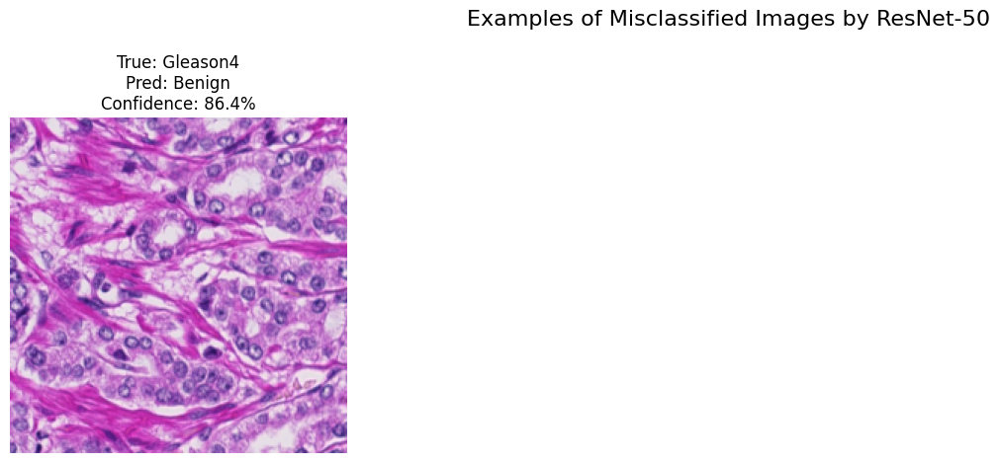

In [ ]:
# Cell 6: Enhanced Model Evaluation on Test Data with Interactive Visualizations

import torch
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import plotly.figure_factory as ff
import plotly.graph_objects as go

# Define the test data loader
test_directory = os.path.join(data_dir, 'test')

# Ensure consistent transformations for the test dataset
test_transformations = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Initialize the test dataset and data loader
test_dataset = datasets.ImageFolder(test_directory, transform=test_transformations)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)

# Switch the model to evaluation mode to disable dropout layers, etc.
resnet_model.eval()

# Initialize lists and counters for evaluation
correct_predictions = 0
true_labels = []
predicted_labels = []
all_probabilities = []

# Iterate over the test data to evaluate the model's performance
for inputs, labels in test_loader:
    # Move inputs and labels to the appropriate device (GPU/CPU)
    inputs, labels = inputs.to(device), labels.to(device)

    # Forward pass without calculating gradients
    with torch.no_grad():
        outputs = resnet_model(inputs)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        _, predictions = torch.max(outputs, 1)

    # Collect true and predicted labels along with model confidence probabilities
    true_labels.extend(labels.cpu().numpy())
    predicted_labels.extend(predictions.cpu().numpy())
    all_probabilities.extend(probabilities.cpu().numpy())

    # Update count of correct predictions for accuracy calculation
    correct_predictions += torch.sum(predictions == labels)

# Calculate the overall accuracy on the test dataset
test_accuracy = correct_predictions.double() / len(test_loader.dataset)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate and display a classification report
print("\nClassification Report:")
print(classification_report(true_labels, predicted_labels, target_names=test_loader.dataset.classes))

# Generate the confusion matrix
confusion_mat = confusion_matrix(true_labels, predicted_labels)

# Create an interactive heatmap for the confusion matrix using Plotly
fig = ff.create_annotated_heatmap(
    z=confusion_mat,
    x=test_loader.dataset.classes,
    y=test_loader.dataset.classes,
    colorscale='Blues',
    annotation_text=confusion_mat.astype(str),
    showscale=True
)

# Update layout for better readability
fig.update_layout(
    title='Interactive Confusion Matrix for ResNet-50',
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    width=700,
    height=600,
)

# Invert y-axis to match the standard confusion matrix layout (True labels on y-axis)
fig['layout']['yaxis']['autorange'] = "reversed"

# Show the confusion matrix interactively
fig.show()

# Print classification report in a more readable format with Plotly Table
classification_rep = classification_report(true_labels, predicted_labels, target_names=test_loader.dataset.classes, output_dict=True)

# Prepare data for Plotly table
table_header = ["Class", "Precision", "Recall", "F1-Score", "Support"]
table_values = [
    list(classification_rep.keys())[:-3],  # Class labels
    [f"{classification_rep[key]['precision']:.2f}" for key in classification_rep if key not in ('accuracy', 'macro avg', 'weighted avg')],
    [f"{classification_rep[key]['recall']:.2f}" for key in classification_rep if key not in ('accuracy', 'macro avg', 'weighted avg')],
    [f"{classification_rep[key]['f1-score']:.2f}" for key in classification_rep if key not in ('accuracy', 'macro avg', 'weighted avg')],
    [f"{classification_rep[key]['support']}" for key in classification_rep if key not in ('accuracy', 'macro avg', 'weighted avg')]
]

# Add overall metrics like accuracy, macro avg, weighted avg separately
overall_metrics = [
    ["Accuracy", f"{classification_rep['accuracy']:.2f}", "-", "-", "-"],
    ["Macro Avg", f"{classification_rep['macro avg']['precision']:.2f}", f"{classification_rep['macro avg']['recall']:.2f}",
     f"{classification_rep['macro avg']['f1-score']:.2f}", f"{classification_rep['macro avg']['support']}"],
    ["Weighted Avg", f"{classification_rep['weighted avg']['precision']:.2f}", f"{classification_rep['weighted avg']['recall']:.2f}",
     f"{classification_rep['weighted avg']['f1-score']:.2f}", f"{classification_rep['weighted avg']['support']}"]
]

# Create the interactive classification report table
table_values[0].extend([metric[0] for metric in overall_metrics])
table_values[1].extend([metric[1] for metric in overall_metrics])
table_values[2].extend([metric[2] for metric in overall_metrics])
table_values[3].extend([metric[3] for metric in overall_metrics])
table_values[4].extend([metric[4] for metric in overall_metrics])

# Plot the table
fig_table = go.Figure(data=[go.Table(
    header=dict(values=table_header,
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=table_values,
               fill_color='lavender',
               align='left'))
])

# Update table layout
fig_table.update_layout(
    title='Interactive Classification Report for ResNet-50',
    width=800,
    height=500
)

# Show the classification report table interactively
fig_table.show()

# Identify the indices of misclassified images
misclassified_indices = [i for i in range(len(true_labels)) if true_labels[i] != predicted_labels[i]]

# Shuffle the misclassified indices for diverse sampling
np.random.shuffle(misclassified_indices)

# Plotting the first 16 misclassified images
plt.figure(figsize=(15, 15))
for index, misclassified_idx in enumerate(misclassified_indices[:16]):
    # Retrieve the misclassified sample from the dataset
    image, label = test_loader.dataset[misclassified_idx]

    # Convert the image tensor to a NumPy array in HWC (Height-Width-Channel) format
    image_np = image.permute(1, 2, 0).numpy()

    # Unnormalize the image (reverse the normalization applied earlier)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image_np = (image_np * std) + mean
    image_np = np.clip(image_np, 0, 1)

    # Get the predicted label and model confidence
    predicted_label = predicted_labels[misclassified_idx]
    true_label = label
    confidence = all_probabilities[misclassified_idx][predicted_label] * 100

    # Plot the misclassified image with true and predicted labels and confidence score
    plt.subplot(4, 4, index + 1)
    plt.imshow(image_np)
    plt.title(f'True: {test_loader.dataset.classes[true_label]}\nPred: {test_loader.dataset.classes[predicted_label]}\nConfidence: {confidence:.1f}%')
    plt.axis('off')

plt.tight_layout()
plt.suptitle('Examples of Misclassified Images by ResNet-50', fontsize=16, y=1.02)
plt.show()


In [ ]:
# Cell 8: Interactive Grad-CAM Visualization for Deep Understanding with Plotly
import plotly.graph_objects as go
import plotly.subplots as sp

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Attach hooks to save activations and gradients during forward and backward passes
        self.target_layer.register_forward_hook(self._save_activations)
        self.target_layer.register_backward_hook(self._save_gradients)

    def _save_activations(self, module, input, output):
        self.activations = output

    def _save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate_heatmap(self, input_tensor, target_class):
        # Set model to evaluation mode and enable gradients for input
        self.model.eval()
        input_tensor.requires_grad = True

        # Forward pass to get model output
        output = self.model(input_tensor)
        self.model.zero_grad()

        # Backward pass to get gradients for target class
        one_hot = torch.zeros_like(output)
        one_hot[0][target_class] = 1
        output.backward(gradient=one_hot)

        if self.gradients is None:
            raise ValueError("Gradients were not captured properly.")

        # Calculate weights for the Grad-CAM heatmap
        pooled_gradients = torch.mean(self.gradients, dim=(0, 2, 3))
        activations = self.activations[0].detach().cpu().numpy()

        # Apply the calculated weights to activations
        for i in range(len(pooled_gradients)):
            activations[i, :, :] *= pooled_gradients[i].detach().cpu().numpy()

        heatmap = np.mean(activations, axis=0)
        heatmap = np.maximum(heatmap, 0)  # Apply ReLU to the heatmap
        heatmap /= np.max(heatmap) if np.max(heatmap) != 0 else 1  # Normalize to [0, 1]

        return heatmap

# Set target layer to the last convolutional layer in ResNet
target_layer = resnet_model.layer4[-1]

# Instantiate the Grad-CAM class with the model and the target layer
grad_cam = GradCAM(resnet_model, target_layer)

# Function to visualize Grad-CAM results interactively with Plotly for a given input
def visualize_grad_cam_interactive(input_tensor, label, predicted_class, colormap='jet'):
    # Generate Grad-CAM heatmap
    heatmap = grad_cam.generate_heatmap(input_tensor, predicted_class)

    # Prepare the original image for visualization
    image = input_tensor.squeeze(0).detach().cpu().numpy().transpose((1, 2, 0))
    image = (image * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])  # Reverse normalization
    image = np.clip(image, 0, 1)

    # Resize heatmap to match the original image size
    heatmap_resized = cv2.resize(heatmap, (image.shape[1], image.shape[0]))

    # Prepare data for Plotly visualization
    fig = sp.make_subplots(rows=1, cols=3, subplot_titles=("Original Image",
                                                           "Grad-CAM Heatmap",
                                                           "Overlay Heatmap"))

    # Original Image Plot
    fig.add_trace(go.Image(z=np.uint8(image * 255)), row=1, col=1)

    # Heatmap Plot
    fig.add_trace(go.Heatmap(z=heatmap_resized,
                             colorscale=colormap,
                             colorbar=dict(title="Intensity")), row=1, col=2)

    # Overlay Image Plot
    heatmap_overlay = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    overlay_image = cv2.addWeighted(np.uint8(image * 255), 0.6, heatmap_overlay, 0.4, 0)
    fig.add_trace(go.Image(z=overlay_image), row=1, col=3)

    # Update layout for better appearance
    fig.update_layout(title_text=f'Grad-CAM Visualization for {label} (Predicted: {class_labels[predicted_class]})',
                      height=600, width=1500, title_x=0.5)

    # Display interactive figure
    fig.show()

In [ ]:

# Cell 9: Grad-CAM Interactive Visualization for Test Dataset Samples (One Sample per Class)
# Track which classes have been visualized already
visualized_classes = {class_name: False for class_name in class_labels}

# Iterate over the entire test set to find one sample from each class
for inputs, labels in test_loader:
    batch_size = inputs.shape[0]

    for i in range(batch_size):
        # Extract the individual input and label
        input_tensor = inputs[i].unsqueeze(0).to(device)
        label = labels[i].item()
        label_class_name = class_labels[label]

        # Skip if we already visualized an example from this class
        if visualized_classes[label_class_name]:
            continue

        # Set requires_grad to True for input_tensor
        input_tensor.requires_grad = True

        # Forward pass to get the predicted class
        output = resnet_model(input_tensor)
        predicted_class = output.argmax(dim=1).item()

        # Visualize Grad-CAM with an option to select colormap ('jet', 'viridis', etc.)
        visualize_grad_cam_interactive(input_tensor, class_labels[label], predicted_class, colormap='viridis')

        # Mark this class as visualized
        visualized_classes[label_class_name] = True

        # Stop if all classes have been visualized
        if all(visualized_classes.values()):
            break

    # Stop the outer loop if all classes have been visualized
    if all(visualized_classes.values()):
        break

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1827: FutureWarning:

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.



In [ ]:
# Cell - 10: EfficientNet Model Initialization

# Install the required library
!pip install efficientnet-pytorch

import torch
import torch.nn as nn
from efficientnet_pytorch import EfficientNet
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision import datasets

# Assuming you have already loaded the dataset with ImageFolder
# Derive class names from the loaded dataset
class_names = train_dataset.classes
# Load pre-trained EfficientNet
efficientnet_model = EfficientNet.from_pretrained('efficientnet-b0')
# Modify the classifier to match the number of classes in the dataset
num_features = efficientnet_model._fc.in_features
efficientnet_model._fc = nn.Linear(num_features, len(class_names))  # Replace with the correct number of classes
# Move the model to the appropriate device (GPU if available)
efficientnet_model = efficientnet_model.to(device)
# Define the loss function
criterion = nn.CrossEntropyLoss()
# Define the optimizer for EfficientNet with Adam and a learning rate of 0.001
efficientnet_optimizer = torch.optim.Adam(efficientnet_model.parameters(), lr=0.001)

print("EfficientNet model setup complete with modified output layer.")


Loaded pretrained weights for efficientnet-b0
EfficientNet model setup complete with modified output layer.


In [ ]:
# Cell - 11: EfficientNet Training and Validation with Early Stopping and Visualization using Plotly
# Load pre-trained EfficientNet
efficientnet_model = EfficientNet.from_pretrained('efficientnet-b0')

# Modify the classifier to match the number of classes in the dataset
num_features = efficientnet_model._fc.in_features
efficientnet_model._fc = nn.Linear(num_features, len(class_names))  # Replace with your number of classes

# Move the model to GPU if available
efficientnet_model = efficientnet_model.to(device)

# Define criterion and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(efficientnet_model.parameters(), lr=0.001, weight_decay=1e-4)

# Learning rate scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

# Training loop configuration
num_epochs = 30
patience = 5
best_model_weights = efficientnet_model.state_dict()
best_validation_accuracy = 0.0

# Initialize lists for losses and accuracies
train_losses, validation_losses = [], []
train_accuracies = []
validation_accuracies = []
learning_rates = []
val_loader = validation_loader
# Early stopping configuration
early_stop_counter = 0
best_validation_loss = float('inf')

# Training and validation loop
for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    print("-" * 10)

    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
        if phase == 'train':
            efficientnet_model.train()  # Set model to training mode
            dataloader = train_loader
        else:
            efficientnet_model.eval()  # Set model to evaluation mode
            dataloader = val_loader  # Corrected from val_loader to validation_loader

        running_loss = 0.0
        running_corrects = 0

        # Iterate over data
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            with torch.set_grad_enabled(phase == 'train'):
                outputs = efficientnet_model(inputs)
                _, predictions = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                # Backward pass and optimize during training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            # Accumulate loss and accuracy statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(predictions == labels.data)

        epoch_loss = running_loss / len(dataloader.dataset)
        epoch_accuracy = running_corrects.double() / len(dataloader.dataset)

        print(f"{phase} Loss: {epoch_loss:.4f} Accuracy: {epoch_accuracy:.4f}")

        # Store losses and accuracies for visualization
        if phase == 'train':
            train_losses.append(epoch_loss)
            train_accuracies.append(epoch_accuracy.item())
        else:
            validation_losses.append(epoch_loss)
            validation_accuracies.append(epoch_accuracy.item())

            # Check for improvement for early stopping
            if epoch_loss < best_validation_loss:
                best_validation_loss = epoch_loss
                best_model_weights = efficientnet_model.state_dict()  # Deep copy of the model
                early_stop_counter = 0  # Reset the early stop counter
                best_validation_accuracy = epoch_accuracy
            else:
                early_stop_counter += 1

            # Step the scheduler during validation phase and collect learning rate
            scheduler.step(epoch_loss)
            learning_rates.append(optimizer.param_groups[0]['lr'])

    # Early stopping condition
    if early_stop_counter >= patience:
        print("Early stopping triggered.")
        break

# Load best model weights
efficientnet_model.load_state_dict(best_model_weights)
print(f"Best Validation Accuracy: {best_validation_accuracy:.4f}")

# Save the best model
torch.save(best_model_weights, 'efficientnet_best.pth')

# Visualization using Plotly for training/validation metrics and learning rates

# Create subplots for training/validation loss, accuracy, and learning rate
fig = sp.make_subplots(rows=1, cols=3, subplot_titles=("Training and Validation Loss",
                                                       "Training and Validation Accuracy"))

# Plot Training and Validation Loss
fig.add_trace(go.Scatter(x=list(range(1, len(train_losses) + 1)),
                         y=train_losses,
                         mode='lines+markers',
                         name='Training Loss',
                         marker=dict(color='blue')),
              row=1, col=1)

fig.add_trace(go.Scatter(x=list(range(1, len(validation_losses) + 1)),
                         y=validation_losses,
                         mode='lines+markers',
                         name='Validation Loss',
                         marker=dict(color='orange')),
              row=1, col=1)

# Plot Training and Validation Accuracy
fig.add_trace(go.Scatter(x=list(range(1, len(train_accuracies) + 1)),
                         y=train_accuracies,
                         mode='lines+markers',
                         name='Training Accuracy',
                         marker=dict(color='green')),
              row=1, col=2)

fig.add_trace(go.Scatter(x=list(range(1, len(validation_accuracies) + 1)),
                         y=validation_accuracies,
                         mode='lines+markers',
                         name='Validation Accuracy',
                         marker=dict(color='red')),
              row=1, col=2)

# Update layout for better appearance
fig.update_layout(title_text='Training Metrics Visualization for EfficientNet',
                  height=600, width=1600,
                  showlegend=True,
                  title_x=0.5)

# Update axes titles
fig.update_xaxes(title_text='Epochs', row=1, col=1)
fig.update_yaxes(title_text='Loss', row=1, col=1)

fig.update_xaxes(title_text='Epochs', row=1, col=2)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

# Show Plot
fig.show()

Loaded pretrained weights for efficientnet-b0
Epoch 1/30
----------
train Loss: 0.5001 Accuracy: 0.8167
val Loss: 0.7253 Accuracy: 0.8214
Epoch 2/30
----------
train Loss: 0.2775 Accuracy: 0.9000
val Loss: 0.7900 Accuracy: 0.7500
Epoch 3/30
----------
train Loss: 0.1718 Accuracy: 0.9440
val Loss: 0.1198 Accuracy: 0.9286
Epoch 4/30
----------
train Loss: 0.1095 Accuracy: 0.9667
val Loss: 0.1319 Accuracy: 0.9286
Epoch 5/30
----------
train Loss: 0.0966 Accuracy: 0.9702
val Loss: 0.2098 Accuracy: 0.9286
Epoch 6/30
----------
train Loss: 0.1247 Accuracy: 0.9643
val Loss: 0.0898 Accuracy: 1.0000
Epoch 7/30
----------
train Loss: 0.0767 Accuracy: 0.9750
val Loss: 0.4899 Accuracy: 0.7857
Epoch 8/30
----------
train Loss: 0.0835 Accuracy: 0.9786
val Loss: 0.3057 Accuracy: 0.9286
Epoch 9/30
----------
train Loss: 0.1230 Accuracy: 0.9607
val Loss: 1.7948 Accuracy: 0.7500
Epoch 10/30
----------
train Loss: 0.0756 Accuracy: 0.9750
val Loss: 0.3602 Accuracy: 0.8571
Epoch 11/30
----------
train Loss

In [ ]:
# Cell - 12: Interactive Confusion Matrix and Classification Report for EfficientNet

import plotly.figure_factory as ff
import plotly.graph_objects as go

# Set the model to evaluation mode
efficientnet_model.eval()

# Initialize lists to store predictions and true labels
all_predictions = []
all_true_labels = []

# Make predictions on the test set
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Get model predictions
        outputs = efficientnet_model(inputs)
        _, predictions = torch.max(outputs, 1)

        # Append predictions and true labels to respective lists
        all_predictions.extend(predictions.cpu().numpy())
        all_true_labels.extend(labels.cpu().numpy())

# Generate the confusion matrix
confusion_matrix_result = confusion_matrix(all_true_labels, all_predictions)

# Create an interactive heatmap for the confusion matrix using Plotly
fig = ff.create_annotated_heatmap(
    z=confusion_matrix_result,
    x=class_names,
    y=class_names,
    colorscale='Blues',
    annotation_text=confusion_matrix_result.astype(str),
    showscale=True
)

# Update layout for better readability
fig.update_layout(
    title='Interactive Confusion Matrix for EfficientNet',
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    width=700,
    height=600,
)

# Invert y-axis to match the standard confusion matrix layout (True labels on y-axis)
fig['layout']['yaxis']['autorange'] = "reversed"

# Show the confusion matrix interactively
fig.show()

# Print classification report in a more readable format with Plotly Table
classification_rep = classification_report(all_true_labels, all_predictions, target_names=class_names, output_dict=True)

# Prepare data for Plotly table
table_header = ["Class", "Precision", "Recall", "F1-Score", "Support"]
table_values = [
    list(classification_rep.keys())[:-3],  # Class labels
    [f"{classification_rep[key]['precision']:.2f}" for key in classification_rep if key not in ('accuracy', 'macro avg', 'weighted avg')],
    [f"{classification_rep[key]['recall']:.2f}" for key in classification_rep if key not in ('accuracy', 'macro avg', 'weighted avg')],
    [f"{classification_rep[key]['f1-score']:.2f}" for key in classification_rep if key not in ('accuracy', 'macro avg', 'weighted avg')],
    [f"{classification_rep[key]['support']}" for key in classification_rep if key not in ('accuracy', 'macro avg', 'weighted avg')]
]

# Add overall metrics like accuracy, macro avg, weighted avg separately
overall_metrics = [
    ["Accuracy", f"{classification_rep['accuracy']:.2f}", "-", "-", "-"],
    ["Macro Avg", f"{classification_rep['macro avg']['precision']:.2f}", f"{classification_rep['macro avg']['recall']:.2f}",
     f"{classification_rep['macro avg']['f1-score']:.2f}", f"{classification_rep['macro avg']['support']}"],
    ["Weighted Avg", f"{classification_rep['weighted avg']['precision']:.2f}", f"{classification_rep['weighted avg']['recall']:.2f}",
     f"{classification_rep['weighted avg']['f1-score']:.2f}", f"{classification_rep['weighted avg']['support']}"]
]

# Create the interactive classification report table
table_values[0].extend([metric[0] for metric in overall_metrics])
table_values[1].extend([metric[1] for metric in overall_metrics])
table_values[2].extend([metric[2] for metric in overall_metrics])
table_values[3].extend([metric[3] for metric in overall_metrics])
table_values[4].extend([metric[4] for metric in overall_metrics])

# Plot the table
fig_table = go.Figure(data=[go.Table(
    header=dict(values=table_header,
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=table_values,
               fill_color='lavender',
               align='left'))
])

# Update table layout
fig_table.update_layout(
    title='Interactive Classification Report for EfficientNet',
    width=800,
    height=500
)

# Show the classification report table interactively
fig_table.show()


In [ ]:
import plotly.graph_objects as go
import plotly.subplots as sp

# EfficientNet Grad-CAM Visualization with Plotly
# Select the target layer (last convolutional layer of EfficientNet)
target_layer = efficientnet_model._conv_head

# Instantiate Grad-CAM
grad_cam = GradCAM(efficientnet_model, target_layer)

# Visualize Grad-CAM for one sample from each class
visualized_classes = {class_name: False for class_name in class_names}

# Iterate over the test dataset to visualize one sample from each class
for inputs, labels in test_loader:
    batch_size = inputs.shape[0]
    for i in range(batch_size):
        input_tensor = inputs[i].unsqueeze(0).to(device)
        label = labels[i].item()
        label_class_name = class_names[label]

        # Skip if a sample from this class has already been visualized
        if visualized_classes[label_class_name]:
            continue

        # Set requires_grad to True for input_tensor
        input_tensor.requires_grad = True

        # Forward pass to get the predicted class
        output = efficientnet_model(input_tensor)
        pred_class = output.argmax(dim=1).item()

        # Generate Grad-CAM heatmap for the predicted class
        heatmap = grad_cam.generate_heatmap(input_tensor, pred_class)

        # Prepare the original image
        img = input_tensor.squeeze(0).detach().cpu().numpy().transpose((1, 2, 0))
        img = (img * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])  # Reverse normalization
        img = np.clip(img, 0, 1)

        # Resize the heatmap to match the original image size
        heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

        # Create the heatmap overlay on the original image
        heatmap_overlay = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        overlay_img = cv2.addWeighted(np.uint8(img * 255), 0.6, heatmap_overlay, 0.4, 0)

        # Convert images to format suitable for Plotly visualization
        img_plot = (img * 255).astype(np.uint8)
        overlay_plot = overlay_img.astype(np.uint8)
        heatmap_plot = np.uint8(255 * heatmap_resized)

        # Create subplots using Plotly
        fig = sp.make_subplots(rows=1, cols=3, subplot_titles=("Original Image", "Grad-CAM Heatmap", "Heatmap Overlay"))

        # Add the original image
        fig.add_trace(go.Image(z=img_plot), row=1, col=1)

        # Add the heatmap
        fig.add_trace(go.Heatmap(z=heatmap_plot,
                                 colorscale='Jet',
                                 colorbar=dict(title="Heatmap Intensity")),
                      row=1, col=2)

        # Add the overlay image
        fig.add_trace(go.Image(z=overlay_plot), row=1, col=3)

        # Update layout for better readability
        fig.update_layout(
            title=f'Grad-CAM Visualization for Class: {label_class_name}',
            height=400,
            width=1200,
            title_x=0.5
        )

        # Display the interactive Grad-CAM visualization
        fig.show()

        # Mark this class as visualized
        visualized_classes[label_class_name] = True

        # Stop if all classes have been visualized
        if all(visualized_classes.values()):
            break

    # Stop the outer loop if all classes have been visualized
    if all(visualized_classes.values()):
        break


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1827: FutureWarning:

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.

